In [ ]:
!pip install dlib
!pip install imutils
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from imutils import face_utils
import numpy as np
import imutils
import dlib
import cv2
import os
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def show_raw_detection(image, detector, predictor):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  rects = detector(gray, 1)

  for (i, rect) in enumerate(rects):
    shape = predictor(gray, rect)
    shape = face_utils.shape_to_np(shape)

    (x,y,w,h) = face_utils.rect_to_bb(rect)
    cv2.rectangle(image, (x,y), (x+w,y+h),(0,255,0),2)

    cv2.putText(image, "Face #{}".format(i+1), (x-10,y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)

    for (x,y) in shape:
      cv2.circle(image, (x,y), 1, (0,0,255), -1)
    
  cv2_imshow(image)
  cv2.waitKey(0)

In [ ]:
!wget   http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2

--2023-03-20 06:59:17--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M   218MB/s    in 0.3s    

2023-03-20 06:59:18 (218 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [ ]:
!bunzip2 /content/shape_predictor_68_face_landmarks.dat.bz2

datFile =  "/content/shape_predictor_68_face_landmarks.dat"

In [ ]:
def draw_individual_detections(image, detector, predictor):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  rects = detector(gray, 1)

  for (i, rect) in enumerate(rects):
    shape = predictor(gray, rect)
    shape = face_utils.shape_to_np(shape)

    for (name, (i,j)) in face_utils.FACIAL_LANDMARKS_IDXS.items():
      clone = image.copy()
      cv2.putText(clone, name, (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,255), 2)

      for (x,y) in shape[i:j]:
        cv2.circle(clone, (x,y), 1, (0,0,255), -1)

      (x,y,w,h) = cv2.boundingRect(np.array([shape[i:j]]))
      roi = image[y:y + h, x:x+w]
      roi = imutils.resize(roi, width = 250, inter = cv2.INTER_CUBIC)

      cv2_imshow(roi)
      cv2_imshow(clone)

    output = face_utils.visualize_facial_landmarks(image, shape)
    cv2_imshow(output)
    cv2.waitKey(0)

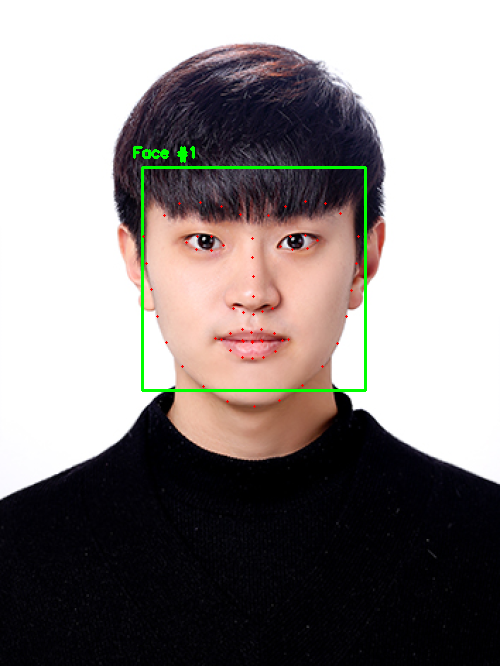

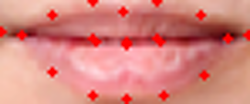

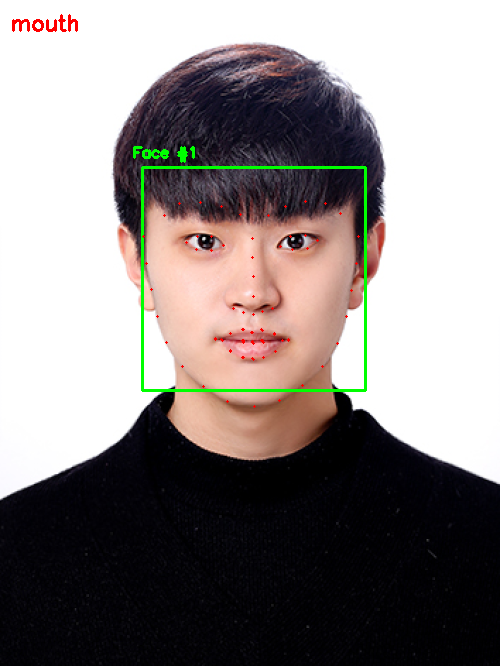

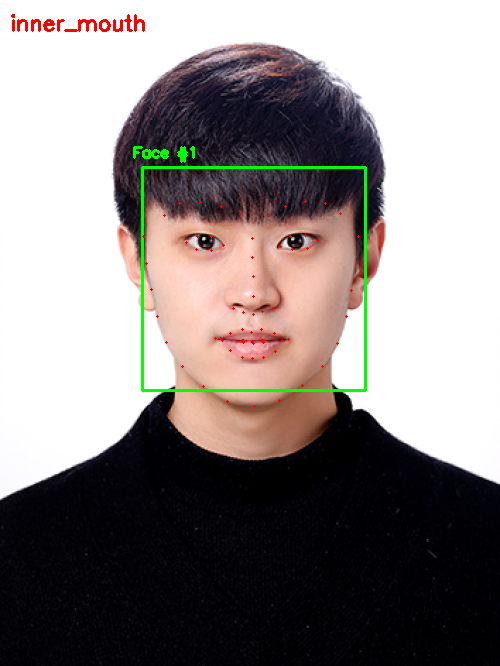

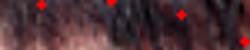

...

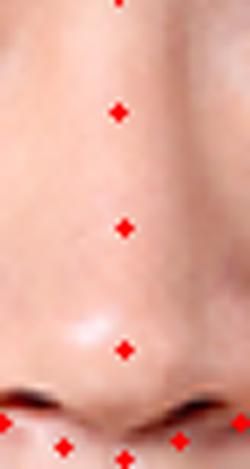

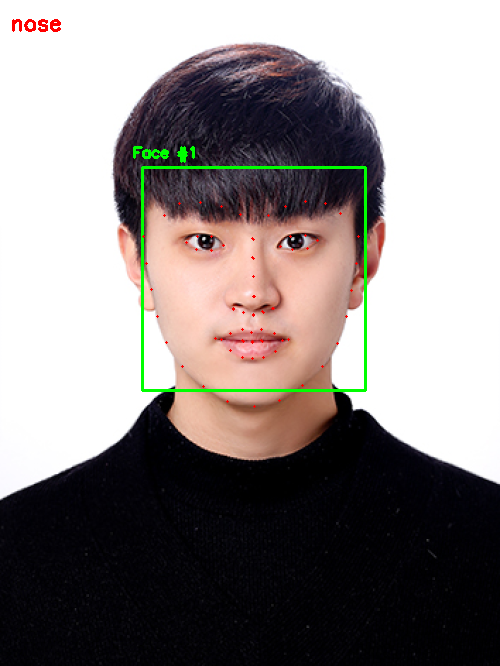

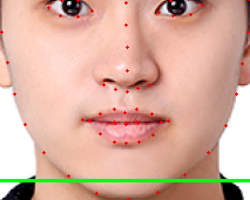

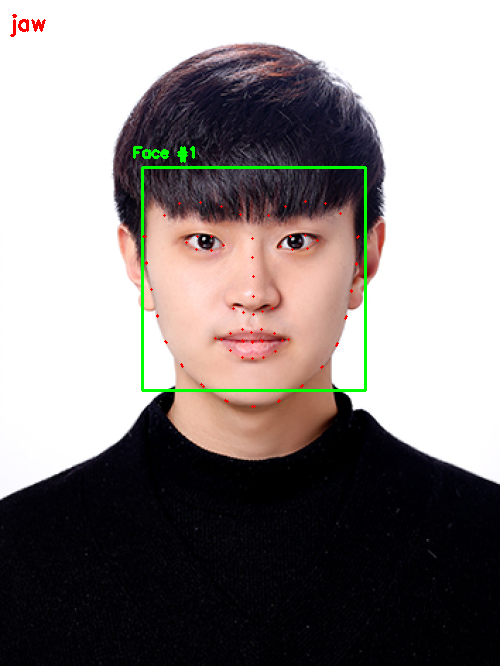

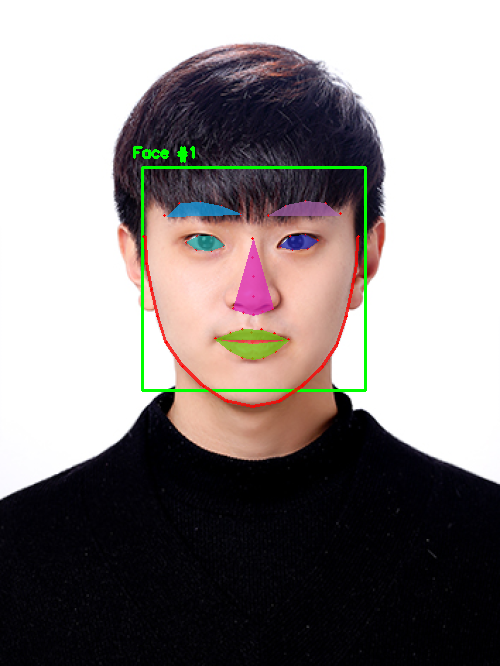

In [ ]:
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(datFile)
img = '/content/drive/MyDrive/myface.jpg'
image = cv2.imread(img)
image = imutils.resize(image, width=500)
show_raw_detection(image, detector, predictor)
draw_individual_detections(image, detector, predictor)

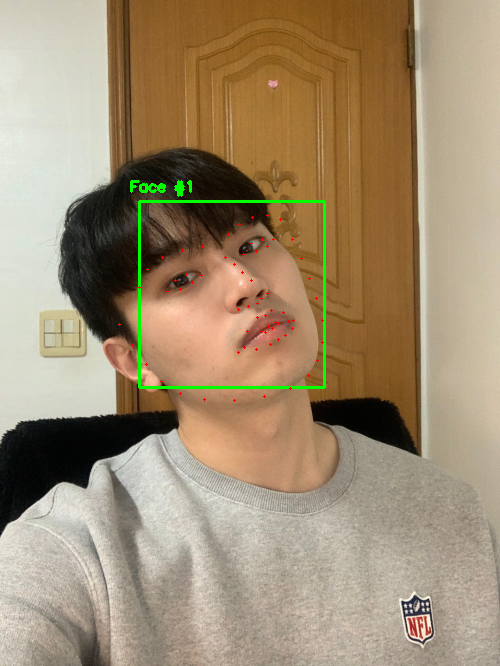

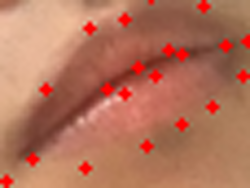

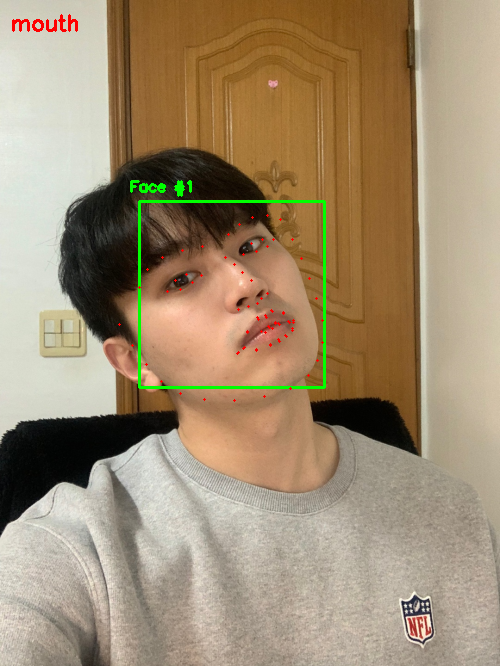

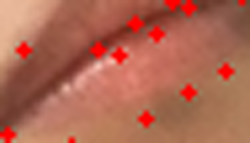

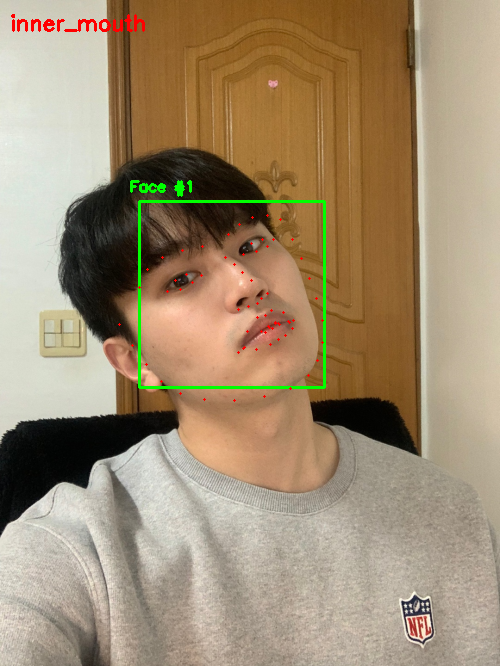

...

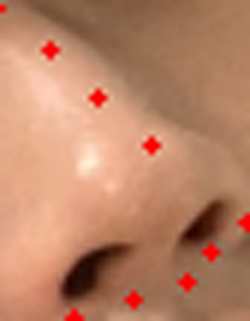

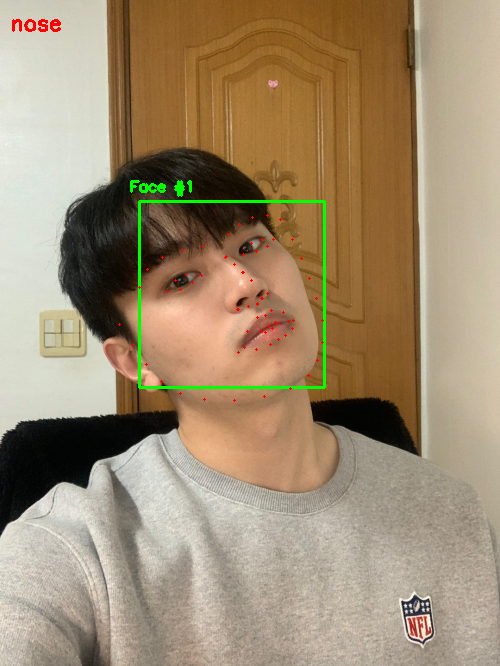

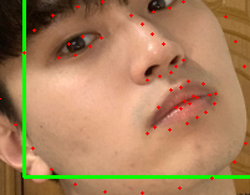

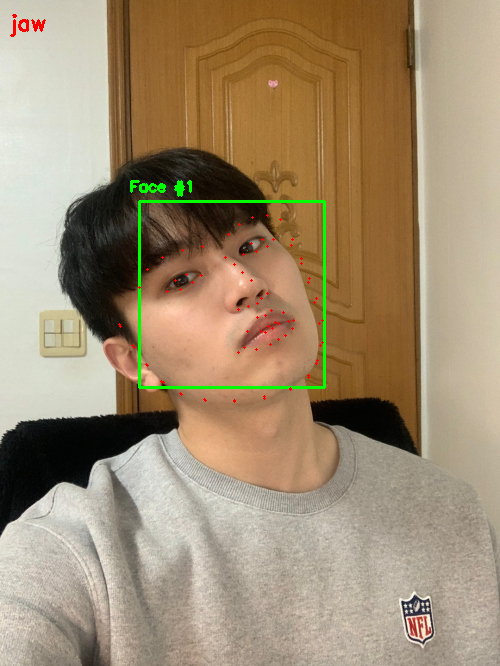

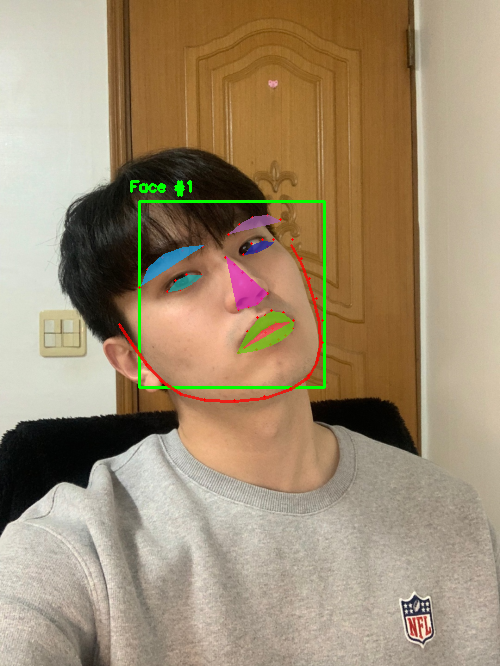

In [ ]:
img2 = '/content/drive/MyDrive/myface2.jpg'
image2 = cv2.imread(img2)
image2 = imutils.resize(image2, width=500)
show_raw_detection(image2, detector, predictor)
draw_individual_detections(image2, detector, predictor)